# Chest X-RAY denosing

## Imports

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf

from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, losses
from tensorflow.keras.datasets import cifar100
from tensorflow.keras.models import Model
from google.colab import drive
import os
import cv2
from sklearn.model_selection import train_test_split
from PIL import Image

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


## Useful Functions

In [ ]:
def getImages(folder_path):
    file_list = [file for file in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, file))]
    image_list = []
    # Read and append each image file as a NumPy array to the list
    for index, file in enumerate(file_list):
        if index % 50 == 0:
            print(f"Getting images #{index}")
        file_path = os.path.join(folder_path, file)
        image = cv2.imread(file_path)
        image = cv2.resize(image, (512, 512), interpolation=cv2.INTER_LINEAR)
        image = image.astype(np.float32) / 255.0
        image_list.append(image)
    print(f"Total images: {len(image_list)}")
    return np.array(image_list)

In [ ]:
def plotImages(images,n = 10):
  plt.figure(figsize=(30, 10))
  for i in range(n):
      ax = plt.subplot(1, n, i + 1)
      plt.title(f"Shape: {images[i].shape}")
      plt.imshow(tf.squeeze(images[i]))
      plt.gray()
  plt.show()

## Reading Data

In [ ]:
x_train = getImages('')

Getting images #0
Getting images #50
Getting images #100
Getting images #150
Getting images #200
Getting images #250
Getting images #300
Getting images #350
Getting images #400
Getting images #450
Getting images #500
Getting images #550
Getting images #600
Getting images #650
Getting images #700
Getting images #750
Getting images #800
Getting images #850
Getting images #900
Getting images #950
Getting images #1000
Getting images #1050
Getting images #1100
Getting images #1150
Getting images #1200
Getting images #1250
Getting images #1300
Total images: 1341


In [ ]:
x_test = getImages('')

Getting images #0
Getting images #50
Getting images #100
Getting images #150
Getting images #200
Total images: 242


In [ ]:
x_test.shape

(242, 512, 512, 3)

In [ ]:
x_test, x_val = train_test_split(x_test, test_size=0.5, random_state=42)

## Exploring Data

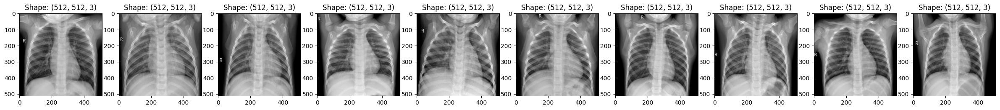

In [ ]:
plotImages(x_train)

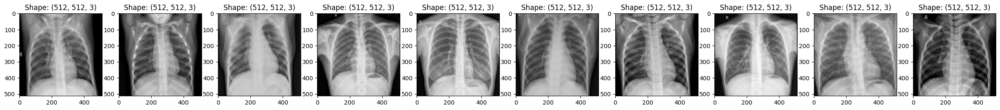

In [ ]:
plotImages(x_test)

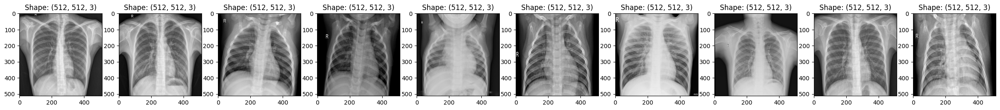

In [ ]:
plotImages(x_val)

## Generating Noise

In [ ]:
noise_factor = 0.65

x_train_noisy = x_train + noise_factor * np.random.normal(size=x_train.shape)
x_test_noisy = x_test + noise_factor * np.random.normal(size=x_test.shape)
x_val_noisy = x_val + noise_factor * np.random.normal(size=x_val.shape)

In [ ]:
x_train_noisy = tf.clip_by_value(x_train_noisy, clip_value_min=0., clip_value_max=1.)
x_test_noisy = tf.clip_by_value(x_test_noisy, clip_value_min=0., clip_value_max=1.)
x_val_noisy = tf.clip_by_value(x_val_noisy, clip_value_min=0., clip_value_max=1.)

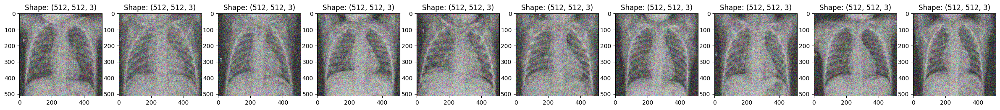

In [ ]:
plotImages(x_train_noisy)

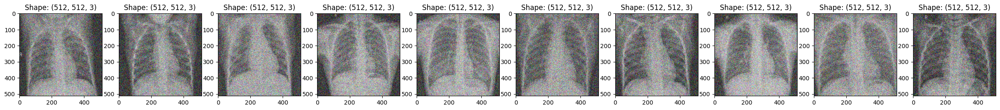

In [ ]:
plotImages(x_test_noisy)

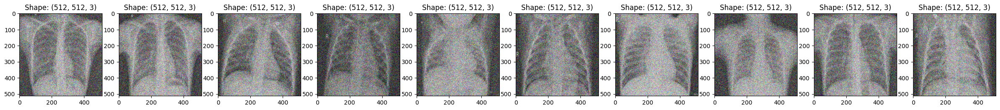

In [ ]:
plotImages(x_val_noisy)

## Experiments

### Experiment 1 Latent Space of shape 8x8x128

#### Creating Model

In [ ]:
class DenoiseModel(Model):

  def __init__(self):

    super(DenoiseModel,self).__init__()

    self.encoder = tf.keras.Sequential([
      layers.Input(shape=(512, 512, 3)),
      layers.Conv2D(4, (3, 3), activation='relu', padding='same', strides=2),
      layers.Conv2D(8, (3, 3), activation='relu', padding='same', strides=2),
      layers.Conv2D(16, (3, 3), activation='relu', padding='same', strides=2),
      layers.Conv2D(32, (3, 3), activation='relu', padding='same', strides=2),
      layers.Conv2D(64, (3, 3), activation='relu', padding='same', strides=2),
      layers.Conv2D(128, (3, 3), activation='relu', padding='same', strides=2),
      layers.Conv2D(256, (3, 3), activation='relu', padding='same', strides=2)])

    self.decoder = tf.keras.Sequential([
      layers.Input(shape=(4, 4, 256)), ## <-- This is the shape of the latent space
      layers.Conv2DTranspose(256, kernel_size=3, strides=2, activation='relu', padding='same'),
      layers.Conv2DTranspose(128, kernel_size=3, strides=2, activation='relu', padding='same'),
      layers.Conv2DTranspose(64, kernel_size=3, strides=2, activation='relu', padding='same'),
      layers.Conv2DTranspose(32, kernel_size=3, strides=2, activation='relu', padding='same'),
      layers.Conv2DTranspose(16, kernel_size=3, strides=2, activation='relu', padding='same'),
      layers.Conv2DTranspose(8, kernel_size=3, strides=2, activation='relu', padding='same'),
      layers.Conv2DTranspose(4, kernel_size=3, strides=2, activation='relu', padding='same'),
      layers.Conv2D(3, kernel_size=3, activation='sigmoid', padding='same')])

  def call(self, x):
    encoded = self.encoder(x)
    decoded = self.decoder(encoded)
    return decoded

autoencoder_small_latent = DenoiseModel()

In [ ]:
autoencoder_small_latent.compile(optimizer='adam', loss=losses.MeanSquaredError())

In [ ]:
autoencoder_small_latent.encoder.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_17 (Conv2D)          (None, 256, 256, 4)       112       
                                                                 
 conv2d_18 (Conv2D)          (None, 128, 128, 8)       296       
                                                                 
 conv2d_19 (Conv2D)          (None, 64, 64, 16)        1168      
                                                                 
 conv2d_20 (Conv2D)          (None, 32, 32, 32)        4640      
                                                                 
 conv2d_21 (Conv2D)          (None, 16, 16, 64)        18496     
                                                                 
 conv2d_22 (Conv2D)          (None, 8, 8, 128)         73856     
                                                                 
 conv2d_23 (Conv2D)          (None, 4, 4, 256)        

In [ ]:
autoencoder_small_latent.decoder.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_transpose_14 (Conv2D  (None, 8, 8, 256)        590080    
 Transpose)                                                      
                                                                 
 conv2d_transpose_15 (Conv2D  (None, 16, 16, 128)      295040    
 Transpose)                                                      
                                                                 
 conv2d_transpose_16 (Conv2D  (None, 32, 32, 64)       73792     
 Transpose)                                                      
                                                                 
 conv2d_transpose_17 (Conv2D  (None, 64, 64, 32)       18464     
 Transpose)                                                      
                                                                 
 conv2d_transpose_18 (Conv2D  (None, 128, 128, 16)    

#### Training Model

In [ ]:
history_small_latent=autoencoder_small_latent.fit(x_train_noisy, x_train,
                epochs=20,
                shuffle=True,
                validation_data=(x_val_noisy, x_val))

Epoch 1/20
42/42 [==============================] - 9s 90ms/step - loss: 0.0611 - val_loss: 0.0599
Epoch 2/20
42/42 [==============================] - 3s 79ms/step - loss: 0.0522 - val_loss: 0.0402
Epoch 3/20
42/42 [==============================] - 3s 78ms/step - loss: 0.0270 - val_loss: 0.0186
Epoch 4/20
42/42 [==============================] - 3s 81ms/step - loss: 0.0142 - val_loss: 0.0122
Epoch 5/20
42/42 [==============================] - 3s 80ms/step - loss: 0.0104 - val_loss: 0.0108
Epoch 6/20
42/42 [==============================] - 3s 77ms/step - loss: 0.0086 - val_loss: 0.0094
Epoch 7/20
42/42 [==============================] - 3s 79ms/step - loss: 0.0075 - val_loss: 0.0078
Epoch 8/20
42/42 [==============================] - 3s 80ms/step - loss: 0.0069 - val_loss: 0.0072
Epoch 9/20
42/42 [==============================] - 3s 79ms/step - loss: 0.0064 - val_loss: 0.0065
Epoch 10/20
42/42 [==============================] - 3s 81ms/step - loss: 0.0061 - val_loss: 0.0068
Epoch 11/

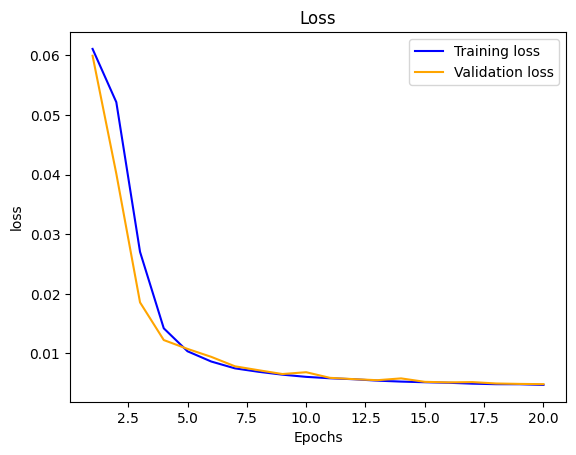

In [ ]:
loss = history_small_latent.history['loss']
val_loss = history_small_latent.history['val_loss']
epochs = range(1, len(loss)+1)
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'orange', label='Validation loss')
plt.title('Loss')
plt.xlabel('Epochs')
plt.ylabel('loss')
plt.legend()
plt.show()

#### Testing Results

In [ ]:
clean_images_small_latent= autoencoder_small_latent.predict(x_test_noisy)

4/4 [==============================] - 0s 28ms/step


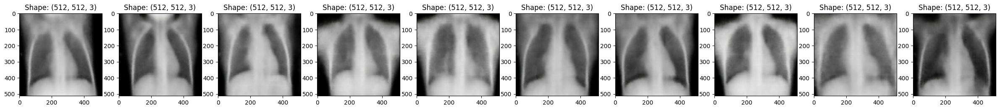

In [ ]:
plotImages(clean_images_small_latent)

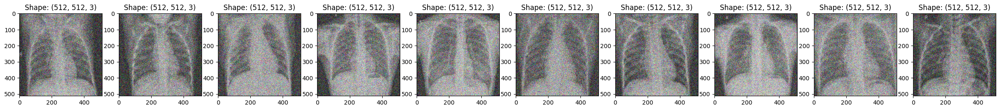

In [ ]:
plotImages(x_test_noisy)

### Experiment 2 Latent Space of shape 16x16x64

#### Creating Model

In [ ]:
class DenoiseModel(Model):

  def __init__(self):

    super(DenoiseModel,self).__init__()

    self.encoder = tf.keras.Sequential([
      layers.Input(shape=(512, 512, 3)),
      layers.Conv2D(4, (3, 3), activation='relu', padding='same', strides=2),
      layers.Conv2D(8, (3, 3), activation='relu', padding='same', strides=2),
      layers.Conv2D(16, (3, 3), activation='relu', padding='same', strides=2),
      layers.Conv2D(32, (3, 3), activation='relu', padding='same', strides=2),
      layers.Conv2D(64, (3, 3), activation='relu', padding='same', strides=2)])

    self.decoder = tf.keras.Sequential([
      layers.Input(shape=(16, 16, 64)), ## <-- This is the shape of the latent space
      layers.Conv2DTranspose(64, kernel_size=3, strides=2, activation='relu', padding='same'),
      layers.Conv2DTranspose(32, kernel_size=3, strides=2, activation='relu', padding='same'),
      layers.Conv2DTranspose(16, kernel_size=3, strides=2, activation='relu', padding='same'),
      layers.Conv2DTranspose(8, kernel_size=3, strides=2, activation='relu', padding='same'),
      layers.Conv2DTranspose(4, kernel_size=3, strides=2, activation='relu', padding='same'),
      layers.Conv2D(3, kernel_size=3, activation='sigmoid', padding='same')])

  def call(self, x):
    encoded = self.encoder(x)
    decoded = self.decoder(encoded)
    return decoded

autoencoder_medium_latent = DenoiseModel()

In [ ]:
autoencoder_medium_latent.compile(optimizer='adam', loss=losses.MeanSquaredError())

In [ ]:
autoencoder_medium_latent.encoder.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 256, 256, 4)       112       
                                                                 
 conv2d_9 (Conv2D)           (None, 128, 128, 8)       296       
                                                                 
 conv2d_10 (Conv2D)          (None, 64, 64, 16)        1168      
                                                                 
 conv2d_11 (Conv2D)          (None, 32, 32, 32)        4640      
                                                                 
 conv2d_12 (Conv2D)          (None, 16, 16, 64)        18496     
                                                                 
Total params: 24,712
Trainable params: 24,712
Non-trainable params: 0
_________________________________________________________________


In [ ]:
autoencoder_medium_latent.decoder.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_transpose_7 (Conv2DT  (None, 32, 32, 64)       36928     
 ranspose)                                                       
                                                                 
 conv2d_transpose_8 (Conv2DT  (None, 64, 64, 32)       18464     
 ranspose)                                                       
                                                                 
 conv2d_transpose_9 (Conv2DT  (None, 128, 128, 16)     4624      
 ranspose)                                                       
                                                                 
 conv2d_transpose_10 (Conv2D  (None, 256, 256, 8)      1160      
 Transpose)                                                      
                                                                 
 conv2d_transpose_11 (Conv2D  (None, 512, 512, 4)     

#### Training Model

In [ ]:
history_medium_latent=autoencoder_medium_latent.fit(x_train_noisy, x_train,
                epochs=20,
                shuffle=True,
                validation_data=(x_val_noisy, x_val))

Epoch 1/20
42/42 [==============================] - 8s 92ms/step - loss: 0.0612 - val_loss: 0.0598
Epoch 2/20
42/42 [==============================] - 3s 78ms/step - loss: 0.0485 - val_loss: 0.0301
Epoch 3/20
42/42 [==============================] - 3s 77ms/step - loss: 0.0181 - val_loss: 0.0077
Epoch 4/20
42/42 [==============================] - 3s 78ms/step - loss: 0.0069 - val_loss: 0.0060
Epoch 5/20
42/42 [==============================] - 3s 77ms/step - loss: 0.0056 - val_loss: 0.0047
Epoch 6/20
42/42 [==============================] - 3s 78ms/step - loss: 0.0052 - val_loss: 0.0044
Epoch 7/20
42/42 [==============================] - 3s 76ms/step - loss: 0.0046 - val_loss: 0.0040
Epoch 8/20
42/42 [==============================] - 3s 78ms/step - loss: 0.0044 - val_loss: 0.0039
Epoch 9/20
42/42 [==============================] - 3s 78ms/step - loss: 0.0042 - val_loss: 0.0036
Epoch 10/20
42/42 [==============================] - 3s 79ms/step - loss: 0.0040 - val_loss: 0.0037
Epoch 11/

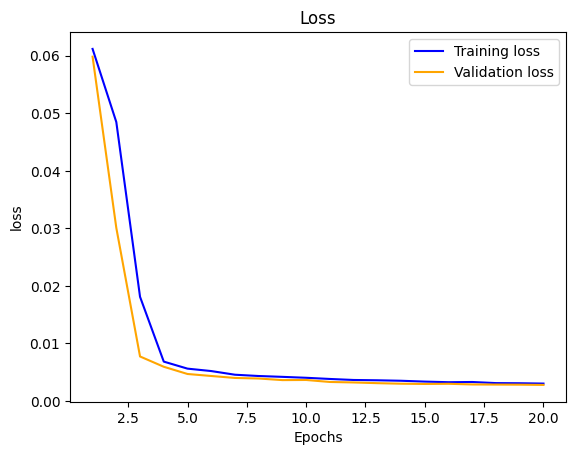

In [ ]:
loss = history_medium_latent.history['loss']
val_loss = history_medium_latent.history['val_loss']
epochs = range(1, len(loss)+1)
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'orange', label='Validation loss')
plt.title('Loss')
plt.xlabel('Epochs')
plt.ylabel('loss')
plt.legend()
plt.show()

#### Testing Results

In [ ]:
clean_images_medium_latent= autoencoder_medium_latent.predict(x_test_noisy)

4/4 [==============================] - 0s 28ms/step


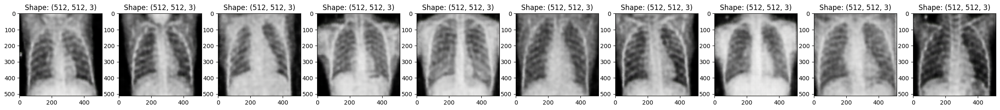

In [ ]:
plotImages(clean_images_medium_latent)

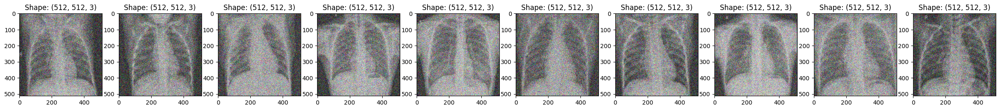

In [ ]:
plotImages(x_test_noisy)

### Experiment 3 Latent Space of shape 128x128x8

#### Creating Model

In [ ]:
class DenoiseModel(Model):

  def __init__(self):

    super(DenoiseModel,self).__init__()

    self.encoder = tf.keras.Sequential([
      layers.Input(shape=(512, 512, 3)),
      layers.Conv2D(4, (3, 3), activation='relu', padding='same', strides=2),
      layers.Conv2D(8, (3, 3), activation='relu', padding='same', strides=2)])

    self.decoder = tf.keras.Sequential([
      layers.Input(shape=(128, 128, 8)), ## <-- This is the shape of the latent space
      layers.Conv2DTranspose(8, kernel_size=3, strides=2, activation='relu', padding='same'),
      layers.Conv2DTranspose(4, kernel_size=3, strides=2, activation='relu', padding='same'),
      layers.Conv2D(3, kernel_size=3, activation='sigmoid', padding='same')])

  def call(self, x):
    encoded = self.encoder(x)
    decoded = self.decoder(encoded)
    return decoded

autoencoder_large_latent = DenoiseModel()

In [ ]:
autoencoder_large_latent.compile(optimizer='adam', loss=losses.MeanSquaredError())

In [ ]:
autoencoder_large_latent.encoder.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_25 (Conv2D)          (None, 256, 256, 4)       112       
                                                                 
 conv2d_26 (Conv2D)          (None, 128, 128, 8)       296       
                                                                 
Total params: 408
Trainable params: 408
Non-trainable params: 0
_________________________________________________________________


In [ ]:
autoencoder_large_latent.decoder.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_transpose_21 (Conv2D  (None, 256, 256, 8)      584       
 Transpose)                                                      
                                                                 
 conv2d_transpose_22 (Conv2D  (None, 512, 512, 4)      292       
 Transpose)                                                      
                                                                 
 conv2d_27 (Conv2D)          (None, 512, 512, 3)       111       
                                                                 
Total params: 987
Trainable params: 987
Non-trainable params: 0
_________________________________________________________________


#### Training Model

In [ ]:
history_large_latent=autoencoder_large_latent.fit(x_train_noisy, x_train,
                epochs=40,
                shuffle=True,
                validation_data=(x_val_noisy, x_val))

Epoch 1/40
42/42 [==============================] - 5s 85ms/step - loss: 0.0610 - val_loss: 0.0589
Epoch 2/40
42/42 [==============================] - 3s 74ms/step - loss: 0.0440 - val_loss: 0.0194
Epoch 3/40
42/42 [==============================] - 3s 74ms/step - loss: 0.0126 - val_loss: 0.0085
Epoch 4/40
42/42 [==============================] - 3s 77ms/step - loss: 0.0074 - val_loss: 0.0061
Epoch 5/40
42/42 [==============================] - 3s 73ms/step - loss: 0.0058 - val_loss: 0.0050
Epoch 6/40
42/42 [==============================] - 3s 74ms/step - loss: 0.0049 - val_loss: 0.0045
Epoch 7/40
42/42 [==============================] - 3s 76ms/step - loss: 0.0045 - val_loss: 0.0041
Epoch 8/40
42/42 [==============================] - 3s 74ms/step - loss: 0.0042 - val_loss: 0.0039
Epoch 9/40
42/42 [==============================] - 3s 76ms/step - loss: 0.0040 - val_loss: 0.0037
Epoch 10/40
42/42 [==============================] - 3s 75ms/step - loss: 0.0038 - val_loss: 0.0036
Epoch 11/

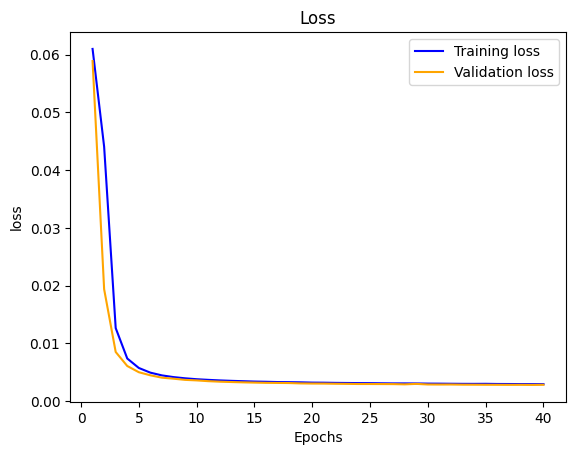

In [ ]:
loss = history_large_latent.history['loss']
val_loss = history_large_latent.history['val_loss']
epochs = range(1, len(loss)+1)
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'orange', label='Validation loss')
plt.title('Loss')
plt.xlabel('Epochs')
plt.ylabel('loss')
plt.legend()
plt.show()

#### Testing Results

In [ ]:
clean_images_large_latent= autoencoder_large_latent.predict(x_test_noisy)

4/4 [==============================] - 0s 27ms/step


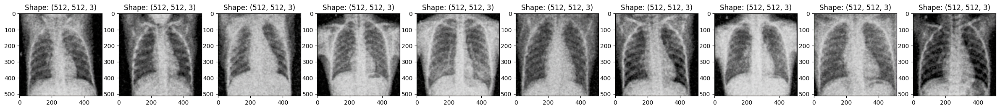

In [ ]:
plotImages(clean_images_large_latent)

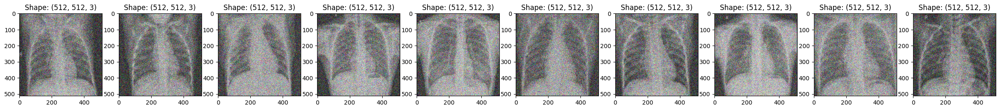

In [ ]:
plotImages(x_test_noisy)

### Results Comparison

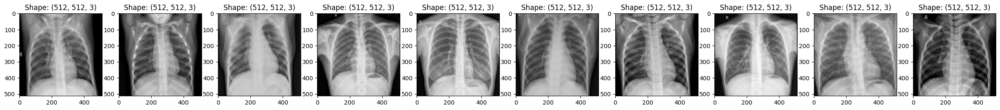

In [ ]:
plotImages(x_test)

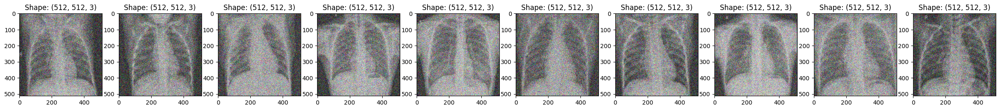

In [ ]:
plotImages(x_test_noisy)

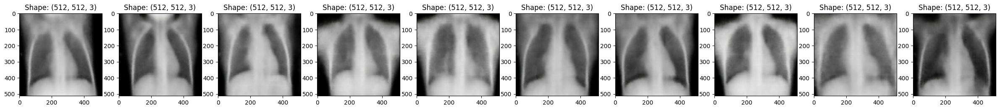

In [ ]:
plotImages(clean_images_small_latent)

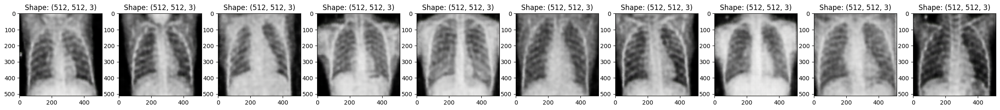

In [ ]:
plotImages(clean_images_medium_latent)

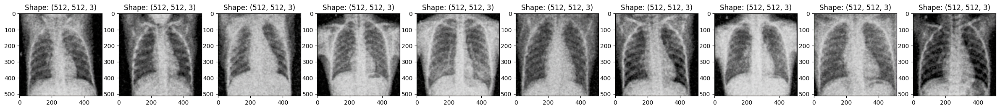

In [ ]:
plotImages(clean_images_large_latent)

## Exporting Models

In [ ]:
autoencoder_small_latent.save('')
autoencoder_medium_latent.save('')
autoencoder_large_latent.save('')

In [ ]:
new_model = tf.keras.models.load_model('')

# Check its architecture
new_model.encoder.summary()

Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_58 (Conv2D)          (None, 256, 256, 4)       112       
                                                                 
 conv2d_59 (Conv2D)          (None, 128, 128, 8)       296       
                                                                 
 conv2d_60 (Conv2D)          (None, 64, 64, 16)        1168      
                                                                 
 conv2d_61 (Conv2D)          (None, 32, 32, 32)        4640      
                                                                 
 conv2d_62 (Conv2D)          (None, 16, 16, 64)        18496     
                                                                 
 conv2d_63 (Conv2D)          (None, 8, 8, 128)         73856     
                                                                 
 conv2d_64 (Conv2D)          (None, 4, 4, 256)       